## Circle Data Science Challenge

This repository contains a sample of synthetic data for the Circle Data Scientist Recruiting process. 
We have the transactions below with fraud labeling. 
We need your help to analyze the data and build fraud detection model.
We expect you to do the following dasks:
* Analyze the data as your data science daily job and help us to find critical insights for fraud detection.
* Build and evaluate some machine learning models, and explain how and why you do this.
* Share some thoughts about how you plan do the realtime inference for production env in the cloud. What is your consideration for trade-off. 
* EXTRA: Any interesting thing you learn from the data

Please send your answer without the transaction data to your recruiter, and include your name in the title of notebook. Respect you have your daily job, we can give you a week of time to send back the code resuilt. 
Thank you for your interest, and look forward to hearing from you soon.

# References

SMOTE: Synthetic Minority Over-sampling Technique
- https://machinelearningmastery.com/smote-oversampling-for-imbalanced-classification/

Credit Card Features
- https://www.forbes.com/advisor/credit-cards/what-does-your-credit-card-number-mean/

scikit-learn-mooc
- https://inria.github.io/scikit-learn-mooc/

In [22]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from IPython.display import display
import datetime # manipulating date formats
from datetime import datetime as dt
import statsmodels.api as sm
# Loading visualization libraries
import seaborn as sns
import matplotlib.pyplot as plt
import pandas_profiling as pp
import time
import sys
import gc
import pickle

# statistcal modeling and machine learning
from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate
from sklearn.compose import ColumnTransformer, make_column_selector
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression, LogisticRegression, Lasso, RidgeCV, LassoCV
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import roc_curve, RocCurveDisplay
from sklearn.metrics import precision_recall_curve, PrecisionRecallDisplay

# for imbalaced data
from imblearn.pipeline import Pipeline
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import BorderlineSMOTE, SVMSMOTE, SMOTE, ADASYN

# Formating the code
import warnings
warnings.filterwarnings('ignore')

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

In [3]:
df = pd.read_csv ('transactionV2.csv')
df.head()

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,128037,2019-03-11 17:22:21,2296006538441789,fraud_Stamm-Witting,shopping_net,4.08,Judy,Hogan,F,4970 Michelle Burgs,...,40.6816,-73.9798,2504700,Medical sales representative,1999-09-01,250f7bdb3d040d18de14a51b17300cb8,1331486541,40.577566,-73.222286,False
1,491755,2019-08-03 03:45:26,30360260465747,fraud_Bradtke PLC,grocery_pos,124.90,Jennifer,Garcia,F,28777 Stewart Plains Apt. 495,...,41.1949,-89.4409,754,"Presenter, broadcasting",1962-05-13,44ec0dc9f8bd8b64c4b527e5b80431c7,1343965526,42.089683,-89.516604,False
2,470924,2019-07-26 19:30:01,503848303379,fraud_Schoen-Quigley,kids_pets,173.39,Gregory,Wallace,M,27203 Darrell Landing,...,26.5290,-82.0916,3776,Sport and exercise psychologist,1976-09-12,74dd18242d9888aa07da26f50c4759d7,1343331001,25.685711,-81.378745,False
3,491263,2019-08-02 23:40:30,4169759661243568,"fraud_McDermott, Osinski and Morar",home,38.55,Jamie,Carr,F,55363 Aaron Circle Suite 450,...,40.2236,-76.5380,213,Special educational needs teacher,1972-02-15,85ef13213b756317285e7859540eecb4,1343950830,40.188092,-76.450154,False
4,836489,2019-12-12 16:51:32,4810789809665942990,fraud_Kozey-Boehm,shopping_net,7.11,Julie,Sanchez,F,916 Charles Road,...,39.5756,-83.7153,338,Quantity surveyor,1988-07-28,b531c4476ccb4d3e0788bb5c4ca28593,1355331092,40.155245,-83.894408,False


# Data Exploration

In [4]:
# how many instances are fraud?
df[df.is_fraud == True].shape

(1783, 23)

In [5]:
df.columns

Index(['Unnamed: 0', 'trans_date_trans_time', 'cc_num', 'merchant', 'category',
       'amt', 'first', 'last', 'gender', 'street', 'city', 'state', 'zip',
       'lat', 'long', 'city_pop', 'job', 'dob', 'trans_num', 'unix_time',
       'merch_lat', 'merch_long', 'is_fraud'],
      dtype='object')

In [6]:
# Data Profiling
pp.ProfileReport(df)

Summarize dataset:   0%|          | 0/36 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
# fraud instances data profiling
pp.ProfileReport(df[df.is_fraud == True])

Summarize dataset:   0%|          | 0/37 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Data Pre-Processing

In [8]:
df.columns

Index(['Unnamed: 0', 'trans_date_trans_time', 'cc_num', 'merchant', 'category',
       'amt', 'first', 'last', 'gender', 'street', 'city', 'state', 'zip',
       'lat', 'long', 'city_pop', 'job', 'dob', 'trans_num', 'unix_time',
       'merch_lat', 'merch_long', 'is_fraud'],
      dtype='object')

create date features

In [9]:
date_cols = make_column_selector(pattern = 'trans_', dtype_include=object)
date_cols

## Feature Engineering

#### DateTime Features

In [10]:
df['trans_date_trans_time'] = pd.to_datetime(df['trans_date_trans_time'], format = '%Y-%m-%d %H:%M:%S', errors = 'coerce')

df['trans_year'] = df['trans_date_trans_time'].dt.year
df['trans_month'] = df['trans_date_trans_time'].dt.month
df['trans_week'] = df['trans_date_trans_time'].dt.week
df['trans_day'] = df['trans_date_trans_time'].dt.day
df['trans_hour'] = df['trans_date_trans_time'].dt.hour
df['trans_minute'] = df['trans_date_trans_time'].dt.minute
df['trans_dayofweek'] = df['trans_date_trans_time'].dt.dayofweek

#### DOB, AGE, AMT

(array([ 6264., 11866., 17191., 16016., 14092.,  8877.,  7315.,  4114.,
         2807.,  2225.]),
 array([16. , 24.1, 32.2, 40.3, 48.4, 56.5, 64.6, 72.7, 80.8, 88.9, 97. ]),
 <BarContainer object of 10 artists>)

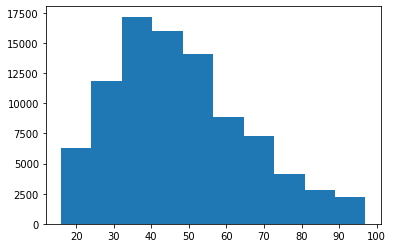

In [11]:
df['dob'] = pd.to_datetime(df.dob, format = '%Y-%m-%d')
df['age'] = dt.today().year - df.dob.dt.year

df['amt2'] = df['amt']**2

counts, bins = np.histogram(df.age)
plt.hist(bins[:-1], bins, weights=counts)

#### Credit Card: The First 6-digits
The first 6-digits of the credit card represent the Issuer Identification Number (IIN), also known as the Bank Identification Number (BIN). These digits clearly identify the financial institution issuing the card. The first digit is the Major Industry Identifier (MII) and it is allocated by the American Banking Association. Each major credit card network has its own MII:

- American Express cards always begin with the number 3- more specifically 34 or 37.
- Visa cards begin with the number 4.
- Mastercards start with the number 5.
- Discover Cards begin with the number 6.

In [12]:
df.bank_id = df.cc_num.map(str).str[:5]
df.bank_id[:5]

0    22960
1    30360
2    50384
3    41697
4    48107
Name: cc_num, dtype: object

In [13]:
features = ['bank_id', 'amt2','category', 'gender', 'state', 'amt', 'zip', 'city_pop', 'unix_time', 
            'trans_year', 'trans_month', 'trans_week', 'trans_day', 'trans_hour', 'trans_minute', 'trans_dayofweek', 'age']

In [14]:
# "Cardinality" means the number of unique values in a column
# Select categorical columns with relatively low cardinality (convenient but arbitrary)

print('# Categorical Cols nunique() < 52')
[cname for cname in df.columns if df[cname].nunique() < 52 and df[cname].dtype == "object"]

categorical_cols = ['category', 'gender', 'state', 'zip', 'merchant', 'job']

# Select numerical columns

print("# Numeric Cols dtype in ['int64', 'float64']")
[cname for cname in df.columns if df[cname].dtype in ['int64', 'float64']]

numerical_cols = ['unix_time',
                 'trans_year',
                 'trans_month',
                 'trans_week',
                 'trans_day',
                 'trans_hour',
                 'trans_minute',
                 'trans_dayofweek'
                 ]

# Select scaled columns

scaled_cols = ['amt', 'amt2', 'age', 'city_pop']

print('# Scaled Cols')
scaled_cols

all_cols = numerical_cols + categorical_cols + scaled_cols

other_cols = [cname for cname in df.columns if cname not in all_cols]

print('# Other Cols')
other_cols

# Categorical Cols nunique() < 52


['category', 'gender', 'state']

# Numeric Cols dtype in ['int64', 'float64']


['Unnamed: 0',
 'cc_num',
 'amt',
 'zip',
 'lat',
 'long',
 'city_pop',
 'unix_time',
 'merch_lat',
 'merch_long',
 'trans_year',
 'trans_month',
 'trans_week',
 'trans_day',
 'trans_hour',
 'trans_minute',
 'trans_dayofweek',
 'age',
 'amt2']

# Scaled Cols


['amt', 'amt2', 'age', 'city_pop']

# Other Cols


['Unnamed: 0',
 'trans_date_trans_time',
 'cc_num',
 'first',
 'last',
 'street',
 'city',
 'lat',
 'long',
 'dob',
 'trans_num',
 'merch_lat',
 'merch_long',
 'is_fraud']

### Split data into train / test

In [15]:
# from sklearn import preprocessing

# lb = preprocessing.LabelBinarizer()
# y = lb.fit_transform(df.is_fraud)

In [16]:
# Split data

x = df[all_cols].copy()
y = df.is_fraud

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=21)
print('Train set:', x_train.shape,  y_train.shape)
print('Test set:', x_test.shape,  y_test.shape)

Train set: (72613, 18) (72613,)
Test set: (18154, 18) (18154,)


In [17]:
x_train.head()

,unix_time,trans_year,trans_month,trans_week,trans_day,trans_hour,trans_minute,trans_dayofweek,category,gender,state,zip,merchant,job,amt,amt2,age,city_pop
80179,1350758632,2019,10,42,20,18,43,6,home,F,MI,48438,"fraud_O'Connell, Botsford and Hand",Learning disability nurse,69.39,4814.9721,36,6951
37766,1342461779,2019,7,29,16,18,2,1,shopping_net,F,IN,46254,fraud_Bashirian Group,Firefighter,62.07,3852.6849,46,910148
42696,1332027038,2019,3,11,17,23,30,6,travel,M,CA,92210,fraud_Corwin-Romaguera,Learning mentor,7.26,52.7076,66,4677
79815,1350317492,2019,10,42,15,16,11,1,home,M,OH,43076,fraud_Stark-Koss,Audiological scientist,25.44,647.1936,38,9051
31757,1346125449,2019,8,35,28,3,44,2,misc_net,F,NM,87543,fraud_Jaskolski-Vandervort,Architectural technologist,7.41,54.9081,60,247


In [18]:
x_train.columns

Index(['unix_time', 'trans_year', 'trans_month', 'trans_week', 'trans_day',
       'trans_hour', 'trans_minute', 'trans_dayofweek', 'category', 'gender',
       'state', 'zip', 'merchant', 'job', 'amt', 'amt2', 'age', 'city_pop'],
      dtype='object')

## Data Preprocessing

In [19]:
# Preprocessing for numerical data
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant'))
])

# Preprocessing for categorical data
categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Preprocessing for amt
scaler = StandardScaler()

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols),
        ('scale', scaler, scaled_cols)
        ], remainder='drop', verbose_feature_names_out=False
        )

preprocessor.fit(x_train)

ColumnTransformer(transformers=[('num',
                                 Pipeline(steps=[('imputer',
                                                  SimpleImputer(strategy='constant'))]),
                                 ['unix_time', 'trans_year', 'trans_month',
                                  'trans_week', 'trans_day', 'trans_hour',
                                  'trans_minute', 'trans_dayofweek']),
                                ('cat',
                                 Pipeline(steps=[('onehot',
                                                  OneHotEncoder(handle_unknown='ignore'))]),
                                 ['category', 'gender', 'state', 'zip',
                                  'merchant', 'job']),
                                ('scale', StandardScaler(),
                                 ['amt', 'amt2', 'age', 'city_pop'])],
                  verbose_feature_names_out=False)

### Get Transformed Feature Names

In [20]:
cat_features = preprocessor.transformers_[1][1]\
   .named_steps['onehot'].get_feature_names(categorical_cols)

print('# cat_features')
cat_features

num_features = np.array(numerical_cols, dtype='object')

print('# num_features')
num_features

scaled_features = np.array(scaled_cols, dtype='object')

print('# scaled_features')
scaled_features

all_features = np.append(num_features, cat_features)
all_features = np.append(all_features, scaled_features)

print('# all_features')
all_features

# cat_features


array(['category_entertainment', 'category_food_dining',
       'category_gas_transport', ..., 'job_Web designer',
       'job_Wellsite geologist', 'job_Writer'], dtype=object)

# num_features


array(['unix_time', 'trans_year', 'trans_month', 'trans_week',
       'trans_day', 'trans_hour', 'trans_minute', 'trans_dayofweek'],
      dtype=object)

# scaled_features


array(['amt', 'amt2', 'age', 'city_pop'], dtype=object)

# all_features


array(['unix_time', 'trans_year', 'trans_month', ..., 'amt2', 'age',
       'city_pop'], dtype=object)

### Inspect Processed Data

In [19]:
preprocessor.fit(x_train)
processed = pd.DataFrame(preprocessor.transform(x_train).toarray(), columns = all_features)

processed.head(10)
# pp.ProfileReport(processed)

ColumnTransformer(transformers=[('num',
                                 Pipeline(steps=[('imputer',
                                                  SimpleImputer(strategy='constant'))]),
                                 ['unix_time', 'trans_year', 'trans_month',
                                  'trans_week', 'trans_day', 'trans_hour',
                                  'trans_minute', 'trans_dayofweek']),
                                ('cat',
                                 Pipeline(steps=[('onehot',
                                                  OneHotEncoder(handle_unknown='ignore'))]),
                                 ['category', 'gender', 'state', 'zip',
                                  'merchant', 'job']),
                                ('scale', StandardScaler(),
                                 ['amt', 'amt2', 'age', 'city_pop'])],
                  verbose_feature_names_out=False)

,unix_time,trans_year,trans_month,trans_week,trans_day,trans_hour,trans_minute,trans_dayofweek,category_entertainment,category_food_dining,...,job_Waste management officer,job_Water engineer,job_Water quality scientist,job_Web designer,job_Wellsite geologist,job_Writer,amt,amt2,age,city_pop
0,1.350759e+09,2019.0,10.0,42.0,20.0,18.0,43.0,6.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,-0.006550,-0.024612,-0.679716,-0.274017
1,1.342462e+09,2019.0,7.0,29.0,16.0,18.0,2.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,-0.056020,-0.025687,-0.105217,2.718859
2,1.332027e+09,2019.0,3.0,11.0,17.0,23.0,30.0,6.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,-0.426438,-0.029933,1.043782,-0.281553
3,1.350317e+09,2019.0,10.0,42.0,15.0,16.0,11.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,-0.303573,-0.029269,-0.564816,-0.267059
4,1.346125e+09,2019.0,8.0,35.0,28.0,3.0,44.0,2.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,-0.425424,-0.029930,0.699082,-0.296232
5,1.326421e+09,2019.0,1.0,2.0,13.0,2.0,18.0,6.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,-0.038313,-0.025316,1.790631,-0.141495
6,1.358667e+09,2020.0,1.0,4.0,20.0,7.0,25.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,-0.177870,-0.027825,0.928882,-0.245202
7,1.328834e+09,2019.0,2.0,6.0,10.0,0.0,37.0,6.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,-0.446983,-0.029972,0.469283,-0.296133
8,1.342141e+09,2019.0,7.0,28.0,13.0,0.0,55.0,5.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.146321,-0.020533,0.124583,0.527577
9,1.341918e+09,2019.0,7.0,28.0,10.0,11.0,5.0,2.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.221743,-0.018100,0.067133,-0.117162


# Classifiers

### Logistic Regression

In [ ]:
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline

pipeline = Pipeline(steps=[('preprocessor', preprocessor),\
                                 ('borderline-smote', BorderlineSMOTE()),\
                                 # ('svm-smote', SVMSMOTE()),\
                                 ('logistic_regression',  LogisticRegression(random_state=0))])

%time pipeline.fit(x_train, y_train)

print('\n')
print('model score on training data: {}'.format(pipeline.score(x_train, y_train)))
print('model score on testing data: {}'.format(pipeline.score(x_test, y_test)))
print('\n')

importance = np.abs(pipeline.named_steps['logistic_regression'].coef_)
feature_names = np.array(all_features)
df_importance = pd.DataFrame(zip(feature_names, importance), columns = ['feature_names', 'importance'])

# summarize feature importance
importance_filt = importance[abs(importance) > 0]
for i,v in enumerate(importance_filt):
    print('Feature: %0d, Score: %.10f' % (i,v))
    
# df_importance = df_importance.loc[abs(df_importance['importance']) > 0 ]

plt.bar(height=df_importance.importance, x=df_importance.feature_names)
plt.title("Feature importances via coefficients")
plt.show()

In [ ]:
target_predicted = pipeline.predict(x)

cm = confusion_matrix(y, target_predicted, labels=pipeline.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=pipeline.classes_)
disp.plot()

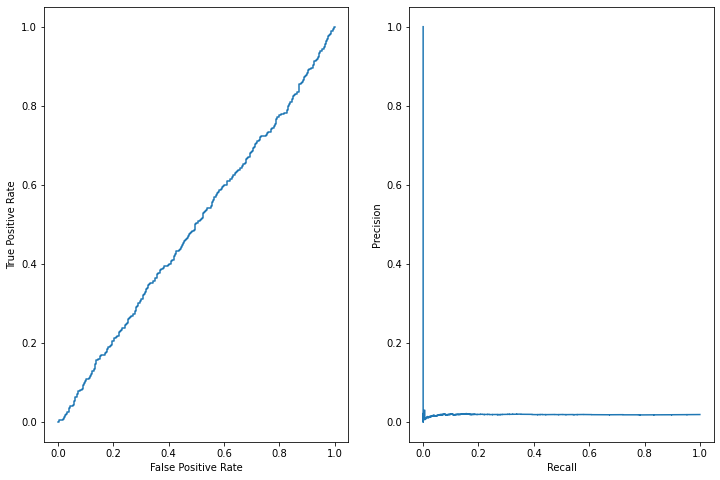

In [241]:
# roc curve
y_score = pipeline.decision_function(x_test)

fpr, tpr, _ = roc_curve(y_test, y_score, pos_label=pipeline.classes_[1])
roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr)

# precision / recall curves
prec, recall, _ = precision_recall_curve(y_test, y_score,
                                         pos_label=pipeline.classes_[1])
pr_display = PrecisionRecallDisplay(precision=prec, recall=recall)

# display roc and precision / recall
import matplotlib.pyplot as plt
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 8))

roc_display.plot(ax=ax1)
pr_display.plot(ax=ax2)
plt.show()

### DecisionTreeClassifier

In [161]:
from matplotlib.colors import ListedColormap
import matplotlib.pyplot as plt
%matplotlib inline

def plot_decision_regions(X, y, classifier, test_idx=None, resolution=0.02):

    # setup marker generator and color map
    markers = ('s', 'x', 'o', '^', 'v')
    colors = ('red', 'blue', 'lightgreen', 'gray', 'cyan')
    cmap = ListedColormap(colors[:len(np.unique(y))])

    # plot the decision surface
    x1_min, x1_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    x2_min, x2_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx1, xx2 = np.meshgrid(np.arange(x1_min, x1_max, resolution),
                         np.arange(x2_min, x2_max, resolution))
    Z = classifier.predict(np.array([xx1.ravel(), xx2.ravel()]).T)
    Z = Z.reshape(xx1.shape)
    plt.contourf(xx1, xx2, Z, alpha=0.4, cmap=cmap)
    plt.xlim(xx1.min(), xx1.max())
    plt.ylim(xx2.min(), xx2.max())

    # plot all samples
    X_test, y_test = X[test_idx, :], y[test_idx]                               
    for idx, cl in enumerate(np.unique(y)):
        plt.scatter(x=X[y == cl, 0], y=X[y == cl, 1],
                    alpha=0.8, c=cmap(idx),
                    marker=markers[idx], label=cl)
        
    # highlight test samples
    if test_idx:
        X_test, y_test = X[test_idx, :], y[test_idx]   
        plt.scatter(X_test[:, 0], X_test[:, 1], c='', 
                alpha=1.0, linewidth=1, marker='o', 
                s=55, label='test set')


In [249]:
from sklearn.tree import DecisionTreeClassifier
from imblearn.pipeline import Pipeline
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import BorderlineSMOTE, SVMSMOTE, SMOTE, ADASYN

pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                       # ('over-sampling', SMOTE(sampling_strategy=0.1)), \
                       ('borderline-smote', BorderlineSMOTE()),
                       # ('svm-smote', SVMSMOTE()),
                       # ('ada-syn', ADASYN()),
                       # ('under-sampling', RandomUnderSampler(sampling_strategy=0.2)), \
                      ('DecisionTreeClassifier',  DecisionTreeClassifier(criterion='entropy', random_state=0))])

%time pipeline.fit(x_train, y_train)

CPU times: user 17.6 s, sys: 1.19 s, total: 18.8 s
Wall time: 19.1 s


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='constant'))]),
                                                  ['unix_time', 'trans_year',
                                                   'trans_month', 'trans_week',
                                                   'trans_day', 'trans_hour',
                                                   'trans_minute',
                                                   'trans_dayofweek']),
                                                 ('cat',
                                                  Pipeline(steps=[('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['category', 'gender',
                                  

### Confusion Matrix ###


array([[88673,   311],
       [  320,  1463]])

### Confusion Matrix Display ###


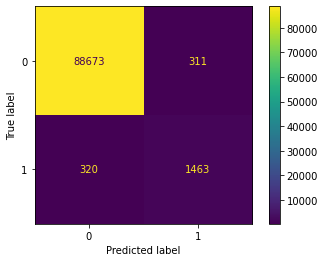

In [263]:
target_predicted = pipeline.predict(x)

cm = confusion_matrix(y, target_predicted, labels=tree.classes_)
print('### Confusion Matrix ###')
cm

# Top Confusion Matrix
# array([[88673,   311],
#        [  320,  1463]])

disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=tree.classes_)

print('### Confusion Matrix Display ###')
disp.plot()

In [ ]:
# https://github.com/rasbt/python-machine-learning-book/blob/master/code/optional-py-scripts/ch03.py


# from sklearn.preprocessing import StandardScaler

# sc = StandardScaler()
# Pipeline(steps=[('preprocessor', preprocessor),
#                        # ('over-sampling', SMOTE(sampling_strategy=0.1)), \
#                        ('borderline-smote', BorderlineSMOTE()),
#                        # ('svm-smote', SVMSMOTE()),
#                        # ('ada-syn', ADASYN()),
#                        # ('under-sampling', RandomUnderSampler(sampling_strategy=0.2)), \
#                       ('DecisionTreeClassifier',  DecisionTreeClassifier(criterion='entropy', random_state=0))])
# sc.fit(x_train)



X_train_std = preprocessor.transform(x_train)
X_test_std = preprocessor.transform(x_test)

from sklearn.linear_model import Perceptron

ppn = Perceptron(random_state=0)
ppn.fit(X_train_std, y_train)

%matplotlib inline

X_combined_std = np.vstack((X_train_std, X_test_std))
y_combined = np.hstack((y_train, y_test))

plot_decision_regions(X=X_combined_std, y=y_combined, 
                      classifier=ppn, test_idx=range(105,150))
plt.xlabel('petal length [standardized]')
plt.ylabel('petal width [standardized]')
plt.legend(loc='upper left')

plt.tight_layout()
# plt.savefig('./figures/iris_perceptron_scikit.png', dpi=300)
plt.show()

### RandomForestClassifier

In [23]:
from sklearn.ensemble import RandomForestClassifier
from imblearn.over_sampling import BorderlineSMOTE

forest = RandomForestClassifier(criterion='entropy',
                                n_estimators=10,
                                random_state=1,
                                n_jobs=2
                               )

pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                       ('borderline-smote', BorderlineSMOTE()),
                      ('RandomForestClassifier',  forest)])

%time pipeline.fit(x_train, y_train)

CPU times: user 14.5 s, sys: 1.29 s, total: 15.8 s
Wall time: 11.4 s


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='constant'))]),
                                                  ['unix_time', 'trans_year',
                                                   'trans_month', 'trans_week',
                                                   'trans_day', 'trans_hour',
                                                   'trans_minute',
                                                   'trans_dayofweek']),
                                                 ('cat',
                                                  Pipeline(steps=[('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['category', 'gender',
                                  

In [ ]:
# pipeline.get_params()

In [ ]:
param_grid = [
  {'borderline-smote__k_neighbors': [1, 5, 10, 100],
   'RandomForestClassifier__n_estimators': [None, 10, 25, 100],
   'RandomForestClassifier__n_jobs': [None, 2, 10, 25],
   'RandomForestClassifier__criterion': ['entropy', 'gini']
  }
]

clf = GridSearchCV(pipeline, param_grid, verbose=3)
%time clf.fit(x_train, y_train)

# sorted(clf.cv_results_.keys())

In [ ]:
from sklearn.model_selection import ParameterGrid

list(ParameterGrid(param_grid))

In [ ]:
clf.base_estimator_
clf.estimators_
clf.feature_importances_

In [ ]:
target_predicted = pipeline.predict(x)

cm = confusion_matrix(y, target_predicted, labels=tree.classes_)
print('### Confusion Matrix ###')
cm

### Top Confusion Matrix ###
# array([[88984,     0],
#        [  621,  1162]])

disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=tree.classes_)

print('### Confusion Matrix Display ###')
disp.plot()
savefig('rf_classifer_confusion_matrix.png')

In [ ]:
%time plot_decision_regions(X_combined, y_combined, classifier=pipeline, test_idx=range(105, 150))

plt.xlabel('petal length [cm]')
plt.ylabel('petal width [cm]')
plt.legend(loc='upper left')
# plt.tight_layout()
# plt.savefig('./figures/random_forest.png', dpi=300)
plt.show()

### AdaBoostClassifier
https://scikit-learn.org/stable/modules/ensemble.html#forest

In [271]:
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import AdaBoostClassifier
from imblearn.over_sampling import BorderlineSMOTE

clf = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('borderline-smote', BorderlineSMOTE()),
    ('AdaBoostClassifier',  AdaBoostClassifier(n_estimators=100))
]).fit(x_train, y_train)


scores = cross_val_score(clf, x, y, cv=5)
scores.mean()

0.9701323274706704

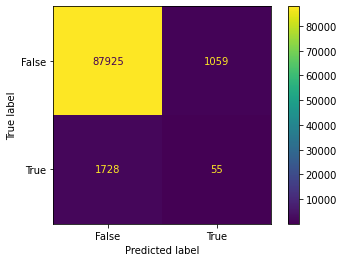

In [272]:
target_predicted = clf.predict(x)

cm = confusion_matrix(y, target_predicted, labels=clf.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=clf.classes_)
disp.plot()

###  GradientBoostingClassifier & SVC Feature Selection

In [269]:
from sklearn.datasets import make_hastie_10_2
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.feature_selection import SelectFromModel
from sklearn.svm import LinearSVC
from imblearn.over_sampling import BorderlineSMOTE

model = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=1, random_state=0)

clf = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('borderline-smote', BorderlineSMOTE()),
    ('feature_selection', SelectFromModel(LinearSVC())),
    ('GradientBoostingClassifier', model)
    ]).fit(x_train, y_train)

clf.score(x_test, y_test)

0.9216701553376666

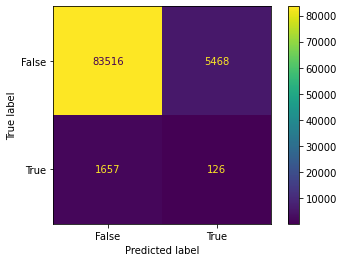

In [270]:
target_predicted = clf.predict(x)

cm = confusion_matrix(y, target_predicted, labels=clf.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=clf.classes_)
disp.plot()

## Probability Calibration curves

https://scikit-learn.org/stable/auto_examples/calibration/plot_calibration_curve.html#sphx-glr-auto-examples-calibration-plot-calibration-curve-py

In [265]:
from sklearn.preprocessing import OrdinalEncoder

# Preprocessing for numerical data
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant'))
])

# Preprocessing for categorical data
categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore', sparse=False))
])

# Preprocessing for amt
scaler = StandardScaler()

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols),
        ('scale', scaler, scaled_cols)
        ], remainder='drop', verbose_feature_names_out=False
        )

preprocessor.fit(x_train)

ColumnTransformer(transformers=[('num',
                                 Pipeline(steps=[('imputer',
                                                  SimpleImputer(strategy='constant'))]),
                                 ['unix_time', 'trans_year', 'trans_month',
                                  'trans_week', 'trans_day', 'trans_hour',
                                  'trans_minute', 'trans_dayofweek']),
                                ('cat',
                                 Pipeline(steps=[('onehot',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse=False))]),
                                 ['category', 'gender', 'state', 'zip',
                                  'merchant', 'job']),
                                ('scale', StandardScaler(),
                                 ['amt', 'amt2', 'age', 'city_pop'])],
                  verbose_feature_names_out=False)

In [266]:
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

from sklearn.calibration import CalibratedClassifierCV, CalibrationDisplay
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB

lr = LogisticRegression(C=1.)
gnb = GaussianNB()
gnb_isotonic = CalibratedClassifierCV(gnb, cv=2, method='isotonic')
gnb_sigmoid = CalibratedClassifierCV(gnb, cv=2, method='sigmoid')

clf_list = [(lr, 'Logistic'),
            (gnb, 'Naive Bayes'),
            (gnb_isotonic, 'Naive Bayes + Isotonic'),
            (gnb_sigmoid, 'Naive Bayes + Sigmoid')]

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='constant'))]),
                                                  ['unix_time', 'trans_year',
                                                   'trans_month', 'trans_week',
                                                   'trans_day', 'trans_hour',
                                                   'trans_minute',
                                                   'trans_dayofweek']),
                                                 ('cat',
                                                  Pipeline(steps=[('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 sparse=False))]),
            

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='constant'))]),
                                                  ['unix_time', 'trans_year',
                                                   'trans_month', 'trans_week',
                                                   'trans_day', 'trans_hour',
                                                   'trans_minute',
                                                   'trans_dayofweek']),
                                                 ('cat',
                                                  Pipeline(steps=[('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 sparse=False))]),
            

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='constant'))]),
                                                  ['unix_time', 'trans_year',
                                                   'trans_month', 'trans_week',
                                                   'trans_day', 'trans_hour',
                                                   'trans_minute',
                                                   'trans_dayofweek']),
                                                 ('cat',
                                                  Pipeline(steps=[('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 sparse=False))]),
            

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='constant'))]),
                                                  ['unix_time', 'trans_year',
                                                   'trans_month', 'trans_week',
                                                   'trans_day', 'trans_hour',
                                                   'trans_minute',
                                                   'trans_dayofweek']),
                                                 ('cat',
                                                  Pipeline(steps=[('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 sparse=False))]),
            

Text(0.5, 1.0, 'Calibration plots (Naive Bayes)')

(array([    0.,     0.,     0.,     0., 18154.,     0.,     0.,     0.,
            0.,     0.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

[Text(0.5, 1.0, 'Logistic'),
 Text(0.5, 0, 'Mean predicted probability'),
 Text(0, 0.5, 'Count')]

(array([   0.,    0.,    0.,    0., 9351., 8803.,    0.,    0.,    0.,
           0.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

[Text(0.5, 1.0, 'Naive Bayes'),
 Text(0.5, 0, 'Mean predicted probability'),
 Text(0, 0.5, 'Count')]

(array([7.9000e+01, 1.0000e+00, 0.0000e+00, 3.0040e+03, 1.9910e+03,
        1.2834e+04, 1.2000e+01, 2.3300e+02, 0.0000e+00, 0.0000e+00]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

[Text(0.5, 1.0, 'Naive Bayes + Isotonic'),
 Text(0.5, 0, 'Mean predicted probability'),
 Text(0, 0.5, 'Count')]

(array([   0.,    0.,    0.,    0., 9351., 8803.,    0.,    0.,    0.,
           0.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

[Text(0.5, 1.0, 'Naive Bayes + Sigmoid'),
 Text(0.5, 0, 'Mean predicted probability'),
 Text(0, 0.5, 'Count')]

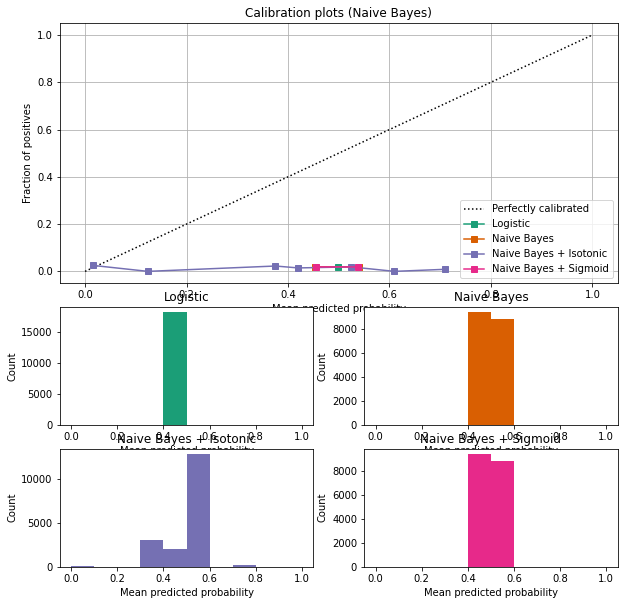

In [267]:
fig = plt.figure(figsize=(10, 10))
gs = GridSpec(4, 2)
colors = plt.cm.get_cmap('Dark2')

ax_calibration_curve = fig.add_subplot(gs[:2, :2])
calibration_displays = {}
for i, (clf, name) in enumerate(clf_list):
    
    pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('borderline-smote', BorderlineSMOTE()),
    ('feature_selection', SelectFromModel(LinearSVC())),
    ('clf', clf)
    ])
    
    pipeline.fit(x_train, y_train)
    
    display = CalibrationDisplay.from_estimator(
        pipeline, x_test, y_test, n_bins=10, name=name, ax=ax_calibration_curve,
        color=colors(i)
    )
    calibration_displays[name] = display

ax_calibration_curve.grid()
ax_calibration_curve.set_title('Calibration plots (Naive Bayes)')

# Add histogram
grid_positions = [(2, 0), (2, 1), (3, 0), (3, 1)]
for i, (_, name) in enumerate(clf_list):
    row, col = grid_positions[i]
    ax = fig.add_subplot(gs[row, col])

    ax.hist(
        calibration_displays[name].y_prob, range=(0, 1), bins=10, label=name,
        color=colors(i)
    )
    ax.set(title=name, xlabel="Mean predicted probability", ylabel="Count")

In [268]:
from collections import defaultdict

import pandas as pd

from sklearn.metrics import (precision_score, recall_score, f1_score,
                             brier_score_loss, log_loss, roc_auc_score)

from sklearn.preprocessing import FunctionTransformer

scores = defaultdict(list)
for i, (clf, name) in enumerate(clf_list):
    
    pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('borderline-smote', BorderlineSMOTE()),
    ('feature_selection', SelectFromModel(LinearSVC())),
    # FunctionTransformer(lambda x: x.todense(), accept_sparse=True),
    ('clf', clf)
    ])
    
    pipeline.fit(x_train, y_train)
    y_prob = pipeline.predict_proba(x_test)
    y_pred = pipeline.predict(x_test)
    scores["Classifier"].append(name)

    for metric in [brier_score_loss, log_loss]:
        score_name = metric.__name__.replace("_", " ").replace("score", "").capitalize()
        scores[score_name].append(metric(y_test, y_prob[:, 1]))

    for metric in [precision_score, recall_score, f1_score, roc_auc_score]:
        score_name = metric.__name__.replace("_", " ").replace("score", "").capitalize()
        scores[score_name].append(metric(y_test, y_pred))

    score_df = pd.DataFrame(scores).set_index("Classifier")
    score_df.round(decimals=3)

score_df

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='constant'))]),
                                                  ['unix_time', 'trans_year',
                                                   'trans_month', 'trans_week',
                                                   'trans_day', 'trans_hour',
                                                   'trans_minute',
                                                   'trans_dayofweek']),
                                                 ('cat',
                                                  Pipeline(steps=[('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 sparse=False))]),
            

,Brier loss,Log loss,Precision,Recall,F1,Roc auc
Classifier,,,,,,
Logistic,0.25,0.692,0.0,0.0,0.0,0.5


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='constant'))]),
                                                  ['unix_time', 'trans_year',
                                                   'trans_month', 'trans_week',
                                                   'trans_day', 'trans_hour',
                                                   'trans_minute',
                                                   'trans_dayofweek']),
                                                 ('cat',
                                                  Pipeline(steps=[('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 sparse=False))]),
            

,Brier loss,Log loss,Precision,Recall,F1,Roc auc
Classifier,,,,,,
Logistic,0.250,0.692,0.000,0.000,0.000,0.500
Naive Bayes,0.248,0.688,0.019,0.484,0.036,0.499


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='constant'))]),
                                                  ['unix_time', 'trans_year',
                                                   'trans_month', 'trans_week',
                                                   'trans_day', 'trans_hour',
                                                   'trans_minute',
                                                   'trans_dayofweek']),
                                                 ('cat',
                                                  Pipeline(steps=[('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 sparse=False))]),
            

,Brier loss,Log loss,Precision,Recall,F1,Roc auc
Classifier,,,,,,
Logistic,0.250,0.692,0.000,0.000,0.000,0.500
Naive Bayes,0.248,0.688,0.019,0.484,0.036,0.499
Naive Bayes + Isotonic,0.245,0.682,0.019,0.711,0.036,0.495


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='constant'))]),
                                                  ['unix_time', 'trans_year',
                                                   'trans_month', 'trans_week',
                                                   'trans_day', 'trans_hour',
                                                   'trans_minute',
                                                   'trans_dayofweek']),
                                                 ('cat',
                                                  Pipeline(steps=[('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 sparse=False))]),
            

,Brier loss,Log loss,Precision,Recall,F1,Roc auc
Classifier,,,,,,
Logistic,0.250,0.692,0.000,0.000,0.000,0.500
Naive Bayes,0.248,0.688,0.019,0.484,0.036,0.499
Naive Bayes + Isotonic,0.245,0.682,0.019,0.711,0.036,0.495
Naive Bayes + Sigmoid,0.248,0.689,0.019,0.484,0.036,0.498


,Brier loss,Log loss,Precision,Recall,F1,Roc auc
Classifier,,,,,,
Logistic,0.249564,0.692276,0.000000,0.000000,0.000000,0.500000
Naive Bayes,0.247615,0.688272,0.018812,0.483965,0.036217,0.498930
Naive Bayes + Isotonic,0.244839,0.682288,0.018656,0.711370,0.036358,0.495374
Naive Bayes + Sigmoid,0.247810,0.688682,0.018749,0.483965,0.036099,0.498088


# Regression

## Lasso CV

CPU times: user 8min 58s, sys: 4.63 s, total: 9min 2s
Wall time: 2min 53s


model score on training data: 4.145222569318374e-05
model score on testing data: -0.00013797344766985908


Feature: 0, Score: 0.0000000001


<BarContainer object of 1 artists>

Text(0.5, 1.0, 'Feature importances via coefficients')

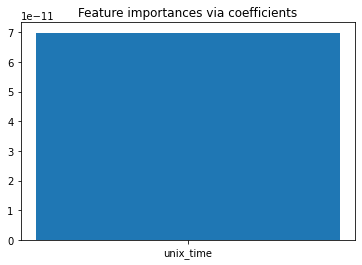

In [20]:
%time pipeline = make_pipeline(preprocessor, LassoCV()).fit(x_train, y_train)

print('\n')
print('model score on training data: {}'.format(pipeline.score(x_train, y_train)))
print('model score on testing data: {}'.format(pipeline.score(x_test, y_test)))
print('\n')

importance = np.abs(pipeline.named_steps['lassocv'].coef_)
feature_names = np.array(all_features)
df_importance = pd.DataFrame(zip(feature_names, importance), columns = ['feature_names', 'importance'])

# summarize feature importance 
importance_filt = importance[abs(importance) > 0]
for i,v in enumerate(importance_filt):
    print('Feature: %0d, Score: %.10f' % (i,v))
    
df_importance = df_importance.loc[abs(df_importance['importance']) > 0 ]

plt.bar(height=df_importance.importance, x=df_importance.feature_names)
plt.title("Feature importances via coefficients")
plt.show()

In [ ]:
target_predicted = pipeline.predict(x)
score = mean_absolute_error(y, target_predicted)
print(f"On average, our regressor makes an error of {score:.2f} k$")

## Lasso CV with Grid Search and L1 Regularization

In [117]:
# https://towardsdatascience.com/feature-selection-in-machine-learning-using-lasso-regression-7809c7c2771a

clf = Pipeline(steps=[('preprocessor', preprocessor),
                      ('lasso',  Lasso())])

search = GridSearchCV(clf,
                      {'lasso__alpha':np.arange(0.01,2,0.25)},
                      cv = 5, scoring="neg_mean_squared_error",verbose=3
                      )

search.fit(x_train,y_train)

search.best_params_

Fitting 5 folds for each of 8 candidates, totalling 40 fits
[CV 1/5] END ................lasso__alpha=0.01;, score=-0.019 total time=   0.8s
[CV 2/5] END ................lasso__alpha=0.01;, score=-0.020 total time=   0.7s
[CV 3/5] END ................lasso__alpha=0.01;, score=-0.018 total time=   0.7s
[CV 4/5] END ................lasso__alpha=0.01;, score=-0.020 total time=   0.7s
[CV 5/5] END ................lasso__alpha=0.01;, score=-0.020 total time=   0.8s
[CV 1/5] END ................lasso__alpha=0.26;, score=-0.019 total time=   0.7s
[CV 2/5] END ................lasso__alpha=0.26;, score=-0.020 total time=   0.7s
[CV 3/5] END ................lasso__alpha=0.26;, score=-0.018 total time=   0.7s
[CV 4/5] END ................lasso__alpha=0.26;, score=-0.020 total time=   0.7s
[CV 5/5] END ................lasso__alpha=0.26;, score=-0.020 total time=   0.7s
[CV 1/5] END ................lasso__alpha=0.51;, score=-0.019 total time=   0.7s
[CV 2/5] END ................lasso__alpha=0.51;, 

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('num',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(strategy='constant'))]),
                                                                         ['unix_time',
                                                                          'trans_year',
                                                                          'trans_month',
                                                                          'trans_week',
                                                                          'trans_day',
                                                                          'trans_hour',
                                                                          'trans_minute'

{'lasso__alpha': 0.26}



model score on training data: -0.01943707906986882
model score on testing data: -0.018539487960300936


Feature: 0, Score: 0.0000000001


<BarContainer object of 1 artists>

Text(0.5, 1.0, 'Feature importances via coefficients')

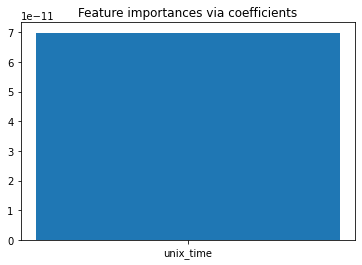

In [118]:
# GET SCORES AND FEATURE IMPORTANCE

print('\n')
print('model score on training data: {}'.format(search.score(x_train, y_train)))
print('model score on testing data: {}'.format(search.score(x_test, y_test)))
print('\n')

importance = np.abs(search.best_estimator_.named_steps['lasso'].coef_)
feature_names = np.array(all_features)
df_importance = pd.DataFrame(zip(feature_names, importance), columns = ['feature_names', 'importance'])

# summarize feature importance
importance_filt = importance[abs(importance) > 0]
for i,v in enumerate(importance_filt):
	print('Feature: %0d, Score: %.10f' % (i,v))
    
df_importance = df_importance.loc[abs(df_importance['importance']) > 0 ]

plt.bar(height=df_importance.importance, x=df_importance.feature_names)
plt.title("Feature importances via coefficients")
plt.show()

,feature,importance
unix_time,unix_time,-6.985644e-11


,feature,importance
unix_time,unix_time,-6.985644e-11


<AxesSubplot:>

Text(0.5, 1.0, 'Lasso model')

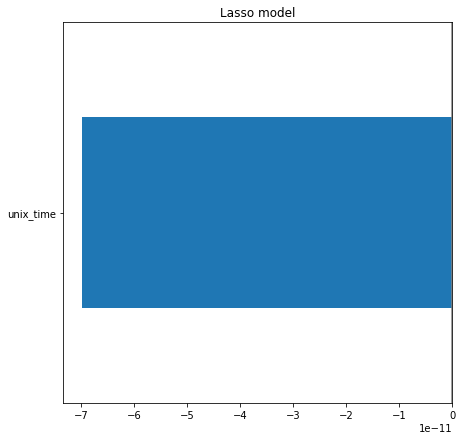

In [119]:
coefficients = search.best_estimator_.named_steps['lasso'].coef_

import matplotlib.pyplot as plt

df_importance = pd.DataFrame(zip(all_features, coefficients), columns = {'feature',  'importance'}, index=all_features).sort_values(by='importance')
df_importance = df_importance.loc[abs(df_importance['importance']) > 0]

display(df_importance .head(10))
display(df_importance .tail(10))

df_importance.importance.plot(kind='barh', figsize=(9, 7))
plt.title('Lasso model')
plt.axvline(x=0, color='.5')
plt.subplots_adjust(left=.3)

## Ridge CV

In [26]:
clf = Pipeline(steps=[('preprocessor', preprocessor),
                      ('ridgecv',  RidgeCV())])

clf.fit(x_train, y_train)

print(f'model score on training data: {clf.score(x_train, y_train)}')
print(f'model score on testing data: {clf.score(x_test, y_test)}')

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='constant'))]),
                                                  ['unix_time', 'trans_year',
                                                   'trans_month', 'trans_week',
                                                   'trans_day', 'trans_hour',
                                                   'trans_minute',
                                                   'trans_dayofweek']),
                                                 ('cat',
                                                  Pipeline(steps=[('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['category', 'gender',
                                  

model score on training data: -3.656297130024297e+16
model score on testing data: -3.807484996458744e+16


In [ ]:
import matplotlib.pyplot as plt

coefficients = clf.named_steps['ridgecv'].coef_

coefs = pd.DataFrame(
   coefficients,
   columns=['Coefficients'], index=all_features
) 
coefs = coefs.loc[abs(coefs['Coefficients']) > 0 ]

importance = np.abs(coefficients)
feature_names = np.array(all_features)
df_importance = pd.DataFrame(zip(feature_names, importance), columns = ['feature_names', 'importance'])

# summarize feature importance
importance_filt = importance[abs(importance) > 0]
for i,v in enumerate(importance_filt):
	print('Feature: %0d, Score: %.10f' % (i,v))
    
df_importance = df_importance.loc[abs(df_importance['importance']) > 0 ]

coefs.plot(kind='barh', figsize=(12, 12))
plt.title('Ridge model')
plt.axvline(x=0, color='.5')
plt.subplots_adjust(left=.3)

In [28]:
df_importance = pd.DataFrame(zip(all_features, coefficients), columns = {'feature',  'importance'}).sort_values(by='importance')

df_importance = df_importance.loc[abs(df_importance['importance']) > 0]

display(df_importance.head(10))

,feature,importance
0,unix_time,-2.074736
58,state_NY,-1.218170
33,state_FL,-1.117169
12,category_grocery_pos,-0.864996
14,category_home,-0.544745
26,state_AR,-0.468899
9,category_food_dining,-0.452549
1781,job_Clothing/textile technologist,-0.441382
73,state_WV,-0.429613
1978,job_Medical sales representative,-0.397423


In [30]:
cv_results = cross_validate(clf, x, y, cv=5,
                            scoring=('r2', 'neg_mean_squared_error'), return_train_score=True)
cv_results

print(cv_results['test_neg_mean_squared_error'])
print(cv_results['train_r2'])

# 'test_score': array([-9.00728838e-05, -2.11536316e-05, -1.08970058e-05, -1.44944230e-05, -1.27125292e-04])

{'fit_time': array([23.26877117, 22.39324808, 23.19880915, 22.51733685, 21.42678809]),
 'score_time': array([0.06038404, 0.05478692, 0.06494069, 0.06921005, 0.06841779]),
 'test_r2': array([-2.12193510e+14, -1.27288514e+12, -2.08965726e+15, -1.43875596e+14,
        -3.09587399e+12]),
 'train_r2': array([-2.13118986e+14, -1.31741444e+12, -2.05679718e+15, -1.40621406e+14,
        -3.09339770e+12]),
 'test_neg_mean_squared_error': array([-4.12442605e+12, -2.51450649e+10, -3.95129524e+13, -2.71289717e+12,
        -5.98504582e+10]),
 'train_neg_mean_squared_error': array([-4.09465460e+12, -2.52068806e+10, -3.97888166e+13, -2.72218632e+12,
        -5.95145005e+10])}

[-4.12442605e+12 -2.51450649e+10 -3.95129524e+13 -2.71289717e+12
 -5.98504582e+10]
[-2.13118986e+14 -1.31741444e+12 -2.05679718e+15 -1.40621406e+14
 -3.09339770e+12]


#### Random Forest

In [ ]:
# Define model
rfr = RandomForestRegressor(n_estimators=100, random_state=0)

# Create pipeline
pipeline = make_pipeline(preprocessor, rfr)

# Fit pipeline
%time pipeline.fit(x_train, y_train)

print('Train set mse:', mean_squared_error(y_train, pipeline.predict(x_train)))
print('Test set mse:', mean_squared_error(y_test, pipeline.predict(x_test)))
print('Test set score:' t, pipeline.score(x_train, y_train))

In [ ]:
# Evaluate pipeline

# Train set mse: 0.0027571839753212234
# Test set mse: 0.018881139142888616
# Test set score: 0.8581541149323948
    
print('Train set mse:', mean_squared_error(y_train, pipeline.predict(x_train)))
print('Test set mse:', mean_squared_error(y_test, pipeline.predict(x_test)))
print('Test set score:', pipeline.score(x_train, y_train))

#### Linear Regression

In [ ]:
# Linear regression
lr = LinearRegression()
pipeline = make_pipeline(preprocessor, lr)
# Fit pipeline
%time pipeline.fit(x_train, y_train)
print('Train set mse:', mean_squared_error(y_train, pipeline.predict(x_train)))
print('Test set mse:', mean_squared_error(y_train_test, pipeline.predict(x_train_test)))
print('Test set score:', pipeline.score(x_train, y_train))

# Model Persistence
Serialize model object using pickle

In [ ]:
# Save pipeline fit object
from joblib import dump, load
dump(pipeline, './pipeline.joblib')

In [ ]:
# Saving the model data:
with open('./model_data.pkl', 'wb') as f:  # Python 3: open(..., 'wb')
    pickle.dump([x_train, x_train_test, y_train, y_train_test], f)

# Model Development & Evaluation

## Export Environment

In [ ]:
!conda env export > environment.yml